# Distance matrix between samples (single-KNN vs double-KNN)
> Required for developing double-KNN correction

- toc: true 
- badges: true
- comments: true

As of now, we are using a KNN correction in the expression space ($\mathbf{Y}$). For each sample, we subtract the mean expression and mean genotype of $K = 30$ nearest neighbors. The nearest neighbors ($NN$) are calculated in the expression space.
\begin{align}
	\mathbf{y}_n & \leftarrow \mathbf{y}_n - \frac{1}{K} \sum_{m \in \mathrm{NN}^K_n} \mathbf{y}_{m} \\
	\mathbf{x}_n & \leftarrow \mathbf{x}_n - \frac{1}{K} \sum_{m \in \mathrm{NN}^K_n} \mathbf{x}_{m}\,.
\end{align}

One idea is to calculate neighbors in the genotype space and perform the KNN correction, before doing the same in the expression space. In this notebook, I have compared the distance matrix between samples after single-KNN (in expression space) and double-KNN (genotype space, followed by expression space).

## Setup

This notebook requires:   
  1. LD filtered genotype
  2. Gene expression matrix

### Data location

In [1]:
#collapse-hide
dosagefile = '/cbscratch/sbanerj/gtex_pca/gtex_v8_filtered.dosage.raw'
dosage_numpy_file = '/cbscratch/sbanerj/gtex_pca/gtex_dosage.npy'
expression_file = '/scratch/sbanerj/trans-eqtl/input/gtex_v8/expression/gtex_ms_raw_std_protein_coding_lncRNA.txt'

### Python libraries

In [2]:
#collapse-hide
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy import stats
import os
from scipy.cluster import hierarchy as hc

import matplotlib.pyplot as plt
import matplotlib
from mpl_toolkits.axes_grid1 import make_axes_locatable
from utils import mpl_stylesheet
mpl_stylesheet.banskt_presentation(fontfamily = 'latex-clearsans', fontsize = 18, colors = 'banskt', dpi = 300)

### Read input data

In [3]:
#collapse-hide
def read_gtex(filename): # returns N x G gene expression
    expr_list = list()
    donor_list = list()
    gene_list = list()
    with open(filename) as mfile:
        donor_list = mfile.readline().strip().split("\t")[1:]
        for line in mfile:
            linesplit = line.strip().split("\t")
            gene = linesplit[0].strip()
            gene_list.append(gene)
            expr = np.array([float(x) for x in linesplit[1:]])
            expr_list.append(expr)
    expr = np.transpose(np.array(expr_list))
    return expr, donor_list, gene_list

def center_expression(Y): 
    '''
    Y is N x G
    here we center the columns, the mean of the columns (genes) are subtracted
    '''
    Ycent = (Y - np.mean(Y, axis = 0)) / np.std(Y, axis = 0)
    return Ycent

def center_genotype(X):
    '''
    X is N x I
    here we center the columns, the mean of the columns (SNPs) are subtracted
    '''
    return X - np.mean(X, axis = 0).reshape(1, -1)


if not os.path.isfile(dosage_numpy_file):
    dosage = np.loadtxt(dosagefile, delimiter=' ', skiprows=1, usecols=range(6, 97612))
    np.save(dosage_numpy_file, dosage)
else:
    dosage = np.load(dosage_numpy_file)
gtsamples = list()
with open (dosagefile, 'r') as infile:
    next(infile)
    for line in infile:
        gtsamples.append(line.strip().split()[1])

gx, gxsamples, _ = read_gtex(expression_file)
gx = center_expression(gx)
sampleidx = [gtsamples.index(x) for x in gxsamples] # assumes all expression samples have genotype
dreduce = dosage[sampleidx, :]
gt = center_genotype(dreduce) #dreduce - np.mean(dreduce, axis = 0).reshape(1, -1)

print(f'{len(sampleidx)} samples, {gx.shape[1]} genes, {gt.shape[1]} SNPs.')
print(f'Centered and normalized genotype and expression. Samples in same order as `gxsamples`')

706 samples, 13236 genes, 97606 SNPs.
Centered and normalized genotype and expression. Samples in same order as `gxsamples`


### Core function modules

1. Calculate PCA, distance matrix and KNN. 
2. Map distance matrix from one sample space to another.  
3. Remove first N principal components from any matrix X.
4. Plotting function.

In [4]:
#collapse-hide
def get_pca(x, K):
    pca = PCA(n_components=K)
    pca.fit(x) # requires N x P (n_samples, n_features)
    x_pca = pca.transform(x)
    return x_pca

def get_distance(a, b):
    return np.linalg.norm(a - b)

def distance_matrix(x_pca):
    nsample = x_pca.shape[0]
    distance_matrix = np.zeros((nsample, nsample))
    for i in range(nsample):
        for j in range(i+1, nsample):
            dist = get_distance(x_pca[i,:], x_pca[j,:])
            distance_matrix[i, j] = dist
            distance_matrix[j, i] = dist
    return distance_matrix

def map_distance_matrix(dm, samples, target_samples):
    N = len(target_samples)
    newdm = np.zeros((N, N))
    newdm[:] = np.nan
    for i in range(N):
        if target_samples[i] in samples:
            newdm[i, i] = 0 # diagonal is always zero
            iold = samples.index(target_samples[i])
            for j in range(i+1, N):
                if target_samples[j] in samples:
                    jold = samples.index(target_samples[j])
                    newdm[i, j] = dm[iold, jold]
                    newdm[j, i] = dm[jold, iold]
    return newdm

def knn(gx, gt, dm, K, center = True):
    assert (gx.shape[0] == gt.shape[0])
    N = gx.shape[0]
    gx_knn = np.zeros_like(gx)
    gt_knn = np.zeros_like(gt)

    for i in range(N):
        #neighbors = np.argsort(distance_matrix[i, :kneighbor + 1])
        neighbors = np.argsort(dm[i, :])[:K + 1][1:]
        gx_knn[i, :] = gx[i, :] - np.mean(gx[neighbors, :], axis = 0)
        gt_knn[:, i] = gt[:, i] - np.mean(gt[:, neighbors[1:]], axis = 1)
        
    if center:
        gx_knn -= np.mean(gx_knn, axis = 0)
        gt_knn -= np.mean(gt_knn, axis = 0)
        
    return gx_knn, gt_knn

def remove_nfirst_pcs(X, n=1):    
    Xnorm = X
    U, S, Vt = np.linalg.svd(X, full_matrices=False)
    Xhat = U[:, n:] @ np.diag(S[n:]) @ Vt[n:, :]
    return Xhat

def plot_distance_matrices(dmA, dmB, norms = None):
    '''
    provide norms, if required, as norms = (norm1, norm2)
    where,
    norm1 = matplotlib.colors.DivergingNorm(vmin=10., vcenter=90., vmax=170.)
    norm2 = matplotlib.colors.DivergingNorm(vmin=0., vcenter=90., vmax=300.)
    '''
    
    fig = plt.figure(figsize = (12, 6))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    
    # the zero distance between the same samples
    # is bad for the color scale.
    dmA[np.diag_indices(dmA.shape[0])] = np.nan
    dmB[np.diag_indices(dmB.shape[0])] = np.nan

    cmap1 = plt.get_cmap("YlOrRd")
    cmap1.set_bad('w')

    cmap2 = plt.get_cmap("YlGnBu")
    cmap2.set_bad('w')

    if norms is not None:
        norm1 = norms[0]
        norm2 = norms[1]
        im1 = ax1.imshow(dmA, cmap = cmap1, norm = norm1, interpolation='nearest')
        im2 = ax2.imshow(dmB, cmap = cmap2, norm = norm2, interpolation='nearest')
    else:
        im1 = ax1.imshow(dmA, cmap = cmap1, interpolation='nearest')
        im2 = ax2.imshow(dmB, cmap = cmap2, interpolation='nearest')        


    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cbar = plt.colorbar(im1, cax=cax, fraction = 0.1)

    divider = make_axes_locatable(ax2)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cbar = plt.colorbar(im2, cax=cax, fraction = 0.1)

    ax1.set_title("Genotype space", pad = 20)
    ax2.set_title("Expression space", pad = 20)
    
    plt.tight_layout()
    return fig

## Calculation

In [5]:
#collapse-show
# Before KNN
DT = 20 # reduced dimension of genotype
DX = 30 # reduced dimension of expression
dm_gt = distance_matrix(get_pca(gt, DT))
dm_gx = distance_matrix(get_pca(gx, DX))

# Expression KNN
K = 30
gx_knn, gt_knn = knn(gx, gt, dm_gx, K)
dm_gt_knn = distance_matrix(get_pca(gt_knn, DT))
dm_gx_knn = distance_matrix(get_pca(gx_knn, DX))

# Double KNN
K1 = 10
K2 = 30
gx_knn1, gt_knn1 = knn(gx, gt, dm_gt, K1)
dm_gx1 = distance_matrix(get_pca(gx_knn1, DX))
gx_knn2, gt_knn2 = knn(gx_knn1, gt_knn1, dm_gx1, K2)

dm_gt_knn2 = distance_matrix(get_pca(gt_knn2, DT))
dm_gx_knn2 = distance_matrix(get_pca(gx_knn2, DX))

### Option 1. Order samples in genotype space

In [6]:
#collapse-hide
o1 = hc.leaves_list(hc.linkage(dm_gt, method = 'centroid'))

/usr/users/sbanerj/miniconda3/envs/py36/lib/python3.7/site-packages/ipykernel_launcher.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  


Define the color bar scales

In [7]:
#collapse-hide
norm1 = matplotlib.colors.DivergingNorm(vmin=10., vcenter=90., vmax=170.)
norm2 = matplotlib.colors.DivergingNorm(vmin=0., vcenter=90., vmax=300.)
norms = (norm1, norm2)

Plot the distance matrix in genotype space and expression space

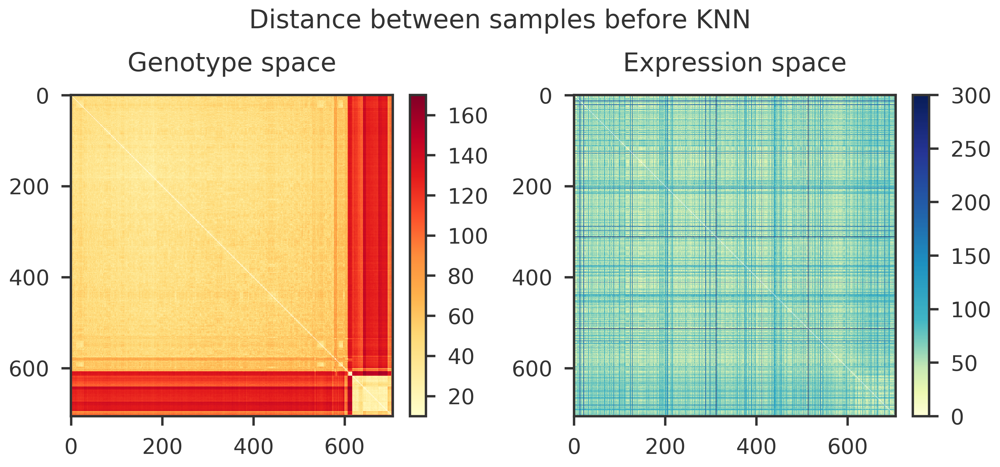

In [8]:
#collapse-show
mgt = dm_gt[o1, :][:, o1]
mgx = dm_gx[o1, :][:, o1]
fig = plot_distance_matrices(mgt, mgx, norms = norms)
fig.suptitle("Distance between samples before KNN")
plt.show()

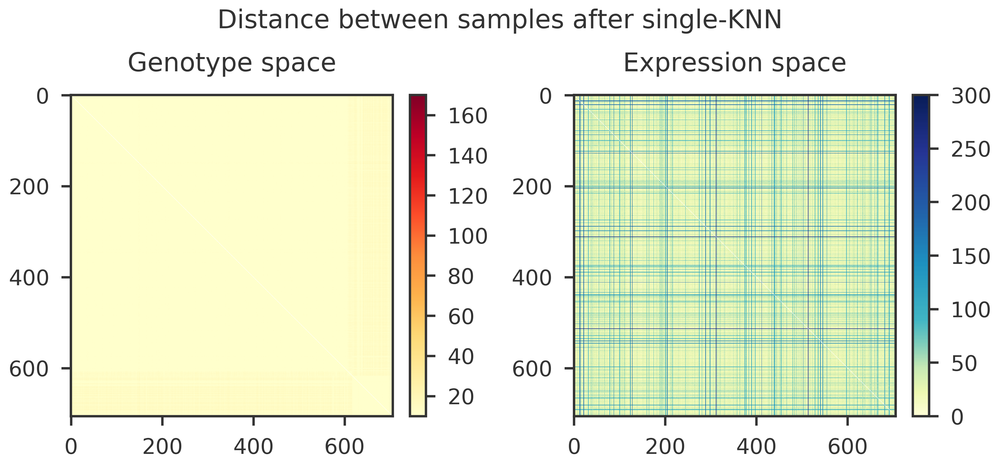

In [9]:
#collapse-show
mgt = dm_gt_knn[o1, :][:, o1]
mgx = dm_gx_knn[o1, :][:, o1]
fig = plot_distance_matrices(mgt, mgx, norms = norms)
fig.suptitle("Distance between samples after single-KNN")
plt.show()

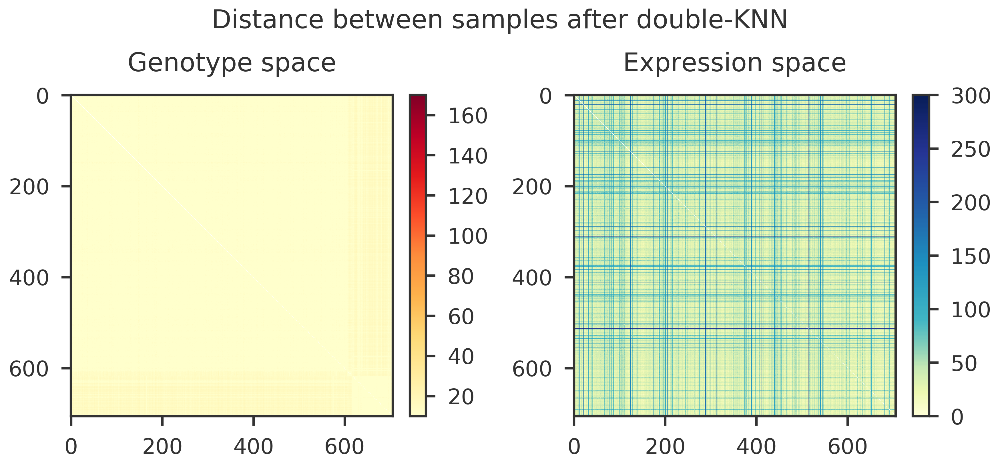

In [10]:
#collapse-show
mgt = dm_gt_knn2[o1, :][:, o1]
mgx = dm_gx_knn2[o1, :][:, o1]
fig = plot_distance_matrices(mgt, mgx, norms = norms)
fig.suptitle("Distance between samples after double-KNN")
plt.show()

### Option 2. Order samples in expression space

In [11]:
#collapse-hide
o2 = hc.leaves_list(hc.linkage(dm_gx, method='centroid'))

/usr/users/sbanerj/miniconda3/envs/py36/lib/python3.7/site-packages/ipykernel_launcher.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  


Use the same color bar scale as above and plot the distance matrices.

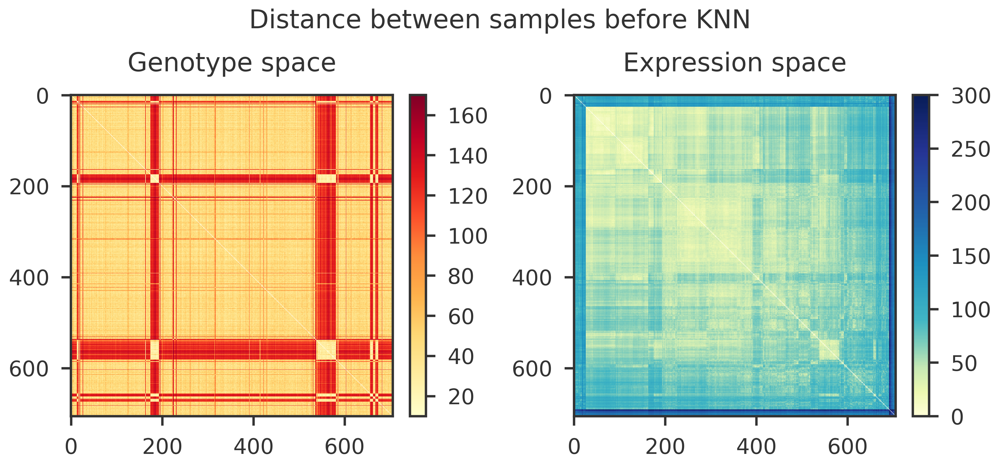

In [12]:
#collapse-show
mgt = dm_gt[o2, :][:, o2]
mgx = dm_gx[o2, :][:, o2]
fig = plot_distance_matrices(mgt, mgx, norms = norms)
fig.suptitle("Distance between samples before KNN")
plt.show()

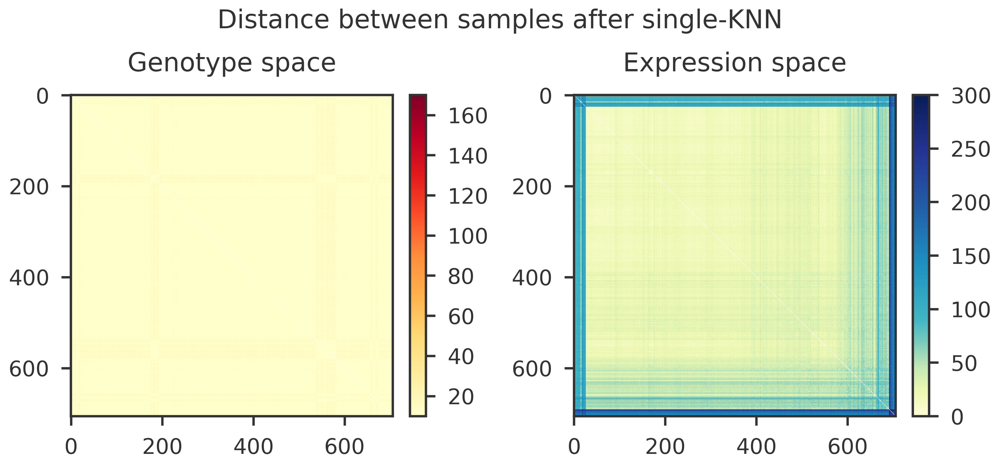

In [13]:
#collapse-show
mgt = dm_gt_knn[o2, :][:, o2]
mgx = dm_gx_knn[o2, :][:, o2]
fig = plot_distance_matrices(mgt, mgx, norms = norms)
fig.suptitle("Distance between samples after single-KNN")
plt.show()

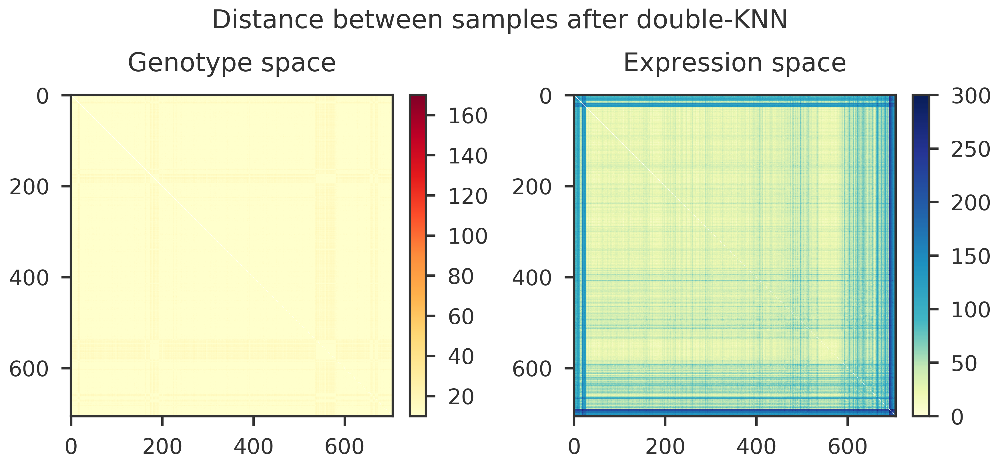

In [14]:
#collapse-show
mgt = dm_gt_knn2[o2, :][:, o2]
mgx = dm_gx_knn2[o2, :][:, o2]
fig = plot_distance_matrices(mgt, mgx, norms = norms)
fig.suptitle("Distance between samples after double-KNN")
plt.show()

### Difference between KNN and double-KNN

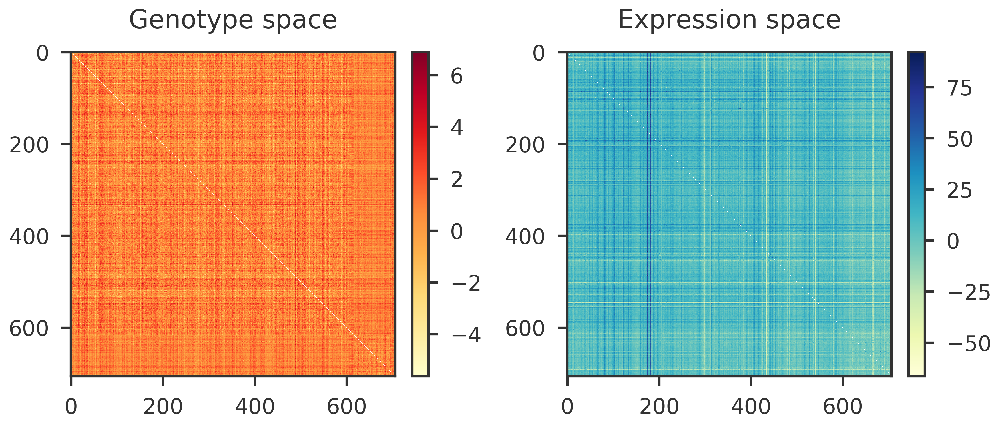

In [15]:
#collapse-show
mgt = dm_gt_knn2[o1, :][:, o1] - dm_gt_knn[o1, :][:, o1]
mgx = dm_gx_knn2[o1, :][:, o1] - dm_gx_knn[o1, :][:, o1]
fig = plot_distance_matrices(mgt, mgx)
plt.show()